# Notebook for "Exploring generative deep learning for omics data by using log-linear models"

In this notebook, we show how to use our log-linear modeling approach to extract patterns from a generative model trained on an artificial dataset and to reprocude the visualizations shown in the corresponding sections of the paper.
We demonstrate how both the extraction of relevant data features and patterns by log-linear modeling alone and the low-dimensional representation of frequent patterns according to their dissimilarity provide insight into the training process and how the low-dimensional pattern representation can be used to compare different generative models.

The notebook has been tested with Julia Version 1.0.5 LTS running on Linux Mint 17.3 (Ubuntu 14.04).

## Simulation design
We first show how to create the artificial dataset we use in the chapter "Artificial data" (see Figure 2). The data structure is inspired by single cell gene expression data characterizing a cell differentiation process: some sets of genes are exclusively expressed within a cell type, while some genes are highly expressed across different cell types.

In our dataset, we discriminate `stageno` distinct cell types or stages based on the expression of 32 genes. Each cell type is characterized by high expression of 5 genes. The sets of genes overlap by `stageoverlap` genes, which we set to 2 in out examples, i.e., the first 5 genes are highly expressed in the first cell type, while gene 4 and 5 are also highly expressed in the second cell type, together with genes 6, 7 and 8, and so on. We add 18 genes which purely represent noise. 
`n` denotes the number of observations and `p` the total number of genes. The number of observations and genes in each stage, `stagen` and `stagep`, are calculated from these values. 

The stair-like structure is created by the function `addstages!`, where we model gene expression as Bernoulli distributed binary variable, i.e., among the genes generally highly expressed within a cell stage, presence of a gene in the observations belonging to that cell type is encoded as 1 drawn from a Bernoulli distribution with probability `blockprob`. To account for technical and biological noise, we model a gene to be present in any other cell stage with probability `noiseprob`. Noise genes are also modeled to be present according to a Bernoulli distribution with probability `noiseprob`.
We visualize the artificial data structure using the plotting package `VegaLite`.  

  Updating registry at `~/.julia/registries/General`
  Updating git-repo `https://github.com/JuliaRegistries/General.git`
 Resolving package versions...
  Updating `~/.julia/environments/v1.0/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v1.0/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/.julia/environments/v1.0/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v1.0/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/.julia/environments/v1.0/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v1.0/Manifest.toml`
 [no changes]


Fontconfig warning: "/etc/fonts/fonts.conf", line 86: unknown element "blank"
Fontconfig warning: "/etc/fonts/fonts.conf", line 86: unknown element "blank"


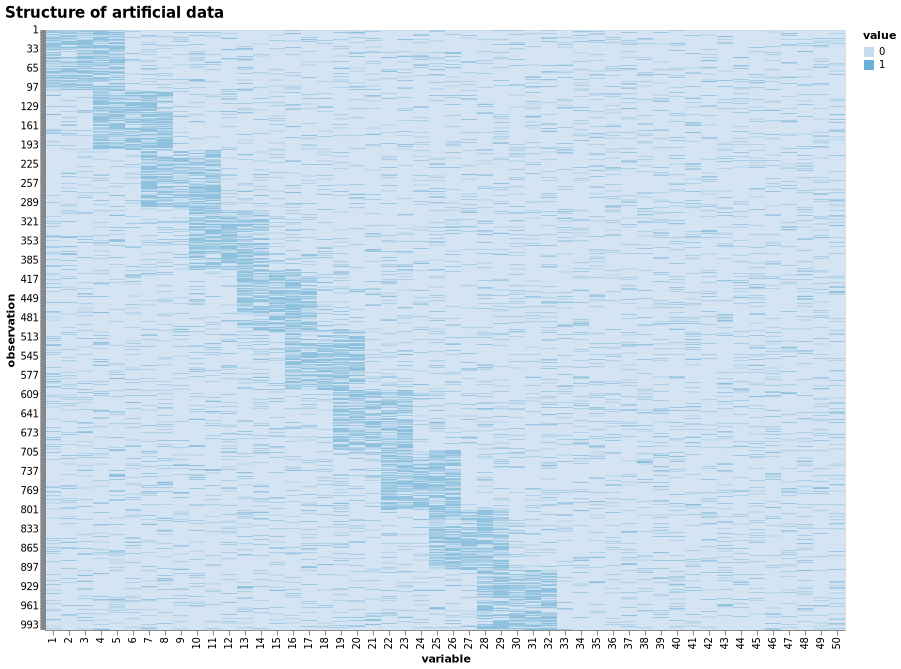

In [1]:
using Random
using Pkg
Pkg.add(Pkg.PackageSpec(;name="StatsBase", version="0.32.0"))
Pkg.add(Pkg.PackageSpec(;name="VegaLite", version="1.0.0"))
Pkg.add(Pkg.PackageSpec(;name="DataFrames", version="0.20.0"))

using StatsBase

function addstages!(x,stageno;stagen=1,stagep=2,overlap=1,blockprob=1.0)
    curp = 1
    curn = 1
    for i = 1:stageno
        if blockprob < 1.0
            curblock = 1.0*(rand(stagen,stagep) .<= blockprob)
            x[curn:(curn+stagen-1),curp:(curp+stagep-1)] = curblock
        else
            x[curn:(curn+stagen-1),curp:(curp+stagep-1)] .= 1.0
        end
        curp += stagep - overlap
        curn += stagen
    end
    #@show curp - 1

    x
end

# create artificial dataset

# set values
n=1000
p=50
stageno = 10
stagep = Int(p/stageno)
stagen = Int(n/stageno)
stageoverlap = 2 
blockprob = 0.6
noiseprob = 0.1

#initialize dataset
Random.seed!(22);
x = 1.0*(rand(n,p) .> (1-noiseprob))

# add stair-like structure of cell stages
addstages!(x,stageno,stagen=stagen,stagep=stagep,overlap=stageoverlap,blockprob=blockprob);

# visualize data structure
using DataFrames
using VegaLite
df = stack(DataFrame(x),1:p)
df[!,:variable] = repeat(1:p,inner=n)
df[!,:observation] = repeat(1:n,p)
structureplot = df |> @vlplot(title={text="Structure of artificial data", anchor="start", fontSize=15},
                            mark=:rect, width=800, height=600, 
                            encoding={ 
                                    x={field="variable", typ="ordinal", sort="null", title = "variable"},
                                    y={field="observation", typ="ordinal", title="observation"}, 
                                    color={field="value", typ="ordinal", 
                                        scale={range=["#c6dbef", "#6baed6"]}}
                                    } 
)

## Monitoring the training process
### Feature and pattern extraction by the Variational Autoencoder

In this section, we demonstrate how we can employ the log-linear modelling approach to extract relevant data features and the corresponding typical value combinations of those features over the course of training epochs and show how to reproduce the corresponding Figure 3 from the paper. In contrast to the version shown in the paper, here we also show information for additional epochs.

#### VAE architecture

First, we define the architecture of the VAE. We employ a latent representation of dimensiona `Dz` and use one hidden layer with `Dh` nodes both in the encoder and decoder. The architecture is inspired by the example in the [Flux model zoo](https://github.com/FluxML/model-zoo/blob/master/vision/mnist/vae.jl). We define the training objective `loss` as negative ELBO, thus following the general VAE training procedure outlined by [Kingma and Welling, 2014](https://arxiv.org/pdf/1312.6114.pdf).

In [2]:
# packages for VAE building and training
Pkg.add(Pkg.PackageSpec(;name="Flux", version="0.9")) ## Flux version working with tracked arrays
Pkg.add(Pkg.PackageSpec(;name="Distributions", version="0.21.9"))
using Flux
using Flux: throttle, params
using Distributions: Bernoulli, logpdf

# define VAE model
Dz, Dh = 5, p 
Random.seed!(13);
# encoder
A, latentμ, latentlogσ = Dense(p, Dh, tanh), Dense(Dh, Dz), Dense(Dh, Dz)
g(X) = (h = A(X); (latentμ(h), latentlogσ(h)))
# latent space of z's
latentz(μ, logσ) = μ + exp.(logσ) * randn()
# decoder
f = Chain(Dense(Dz, Dh, tanh), Dense(Dh, p, σ))
# loss
kl_q_p(μ, logσ) = 0.5 * sum(exp.(2 .* logσ) + μ.^2 .- 1 .- (2 .* logσ))
logp_x_z(x, z) = sum(logpdf.(Bernoulli.(f(z)), x))
L(X) = ((emp_μ, emp_logσ) = g(X); (logp_x_z(X, latentz.(emp_μ, emp_logσ)) - kl_q_p(emp_μ, emp_logσ)))
loss(X) = -L(X) + 0.01 * sum(x->sum(x.^2), Flux.params(f))

 Resolving package versions...
  Updating `~/.julia/environments/v1.0/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v1.0/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/.julia/environments/v1.0/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v1.0/Manifest.toml`
 [no changes]


loss (generic function with 1 method)

#### VAE training and log-linear modelling

Now, we are ready to train our model for `nepochs` epochs and apply log-linear modelling after every `stepsize` epochs. To this end, we extract `n` \* 10 samples of both the original values of the latent variables, which we dichotomize, and of the decoded values. <br>
Subsequently, we apply log-linear modelling to build the set of variables of size `nsetvars` most strongly driven by the latent states. <br>
Finally, we obtain the set of most frequently observed patterns of size `npatterns` for the current variable set. We collect all sets of patterns from all epochs in `allpatterns`.

In [3]:
# Packages needed for log-linear modelling
Pkg.add(PackageSpec(url="https://github.com/ssehztirom/LogLinearModels.jl"))
Pkg.add(PackageSpec(url="https://github.com/ssehztirom/PatternsByLogLin.jl"))
using LogLinearModels
using PatternsByLogLin

nepochs = 200
stepsize = 5
nsetvars = 7
npatterns = 10

# define optimiser, reshape data as needed for Flux.train
ps = Flux.params(A, latentμ, latentlogσ, f)
opt = ADAM(0.0001)
data = [x[i,:]' for i in Iterators.partition(1:n,1)]

# optional callback: show loss to evaluate training
evalcb() = @show(sum(loss.(data)))

# initialize arrays to collect variable sets and patterns
allsets = []
allpatterns = []

# start training!
for epoch = 1:nepochs
    println("$(epoch)")
    Flux.train!(loss, ps, zip(data), opt ,cb=throttle(evalcb,5))
    # draw sampling after every 5 epochs and apply log-linear modelling
    if (mod(epoch,stepsize)==0) 
        vaegen = fill(0.0,n*10,p); 
        vaehidden_orig = fill(0.0,n*10,Dz);
        for i = 1:n*10
            curzs = latentz.(zeros(Dz), zeros(Dz));
            vaehidden_orig[i,:] = curzs; # original values from latent space (real valued)
            vaegen[i,:] = Int.(rand.(Bernoulli.(f(curzs)))).data; # decoded
        end
        vaehidden = 1.0.*(vaehidden_orig .>= 0); # dichotomize real valued zs
        vaesamples = [vaegen, vaehidden];
        curset = sort(PatternsByLogLin.bestset(nsetvars,vaesamples[1],vaesamples[2],verbose=false))
        curpatterns = PatternsByLogLin.toppatterns(vaesamples[1],curset,patternno=npatterns)
        push!(allsets, curset)
        push!(allpatterns, curpatterns)
    end
end

  Updating git-repo `https://github.com/ssehztirom/LogLinearModels.jl`
 Resolving package versions...
  Updating `~/.julia/environments/v1.0/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v1.0/Manifest.toml`
 [no changes]
  Updating git-repo `https://github.com/ssehztirom/PatternsByLogLin.jl`
 Resolving package versions...
  Updating `~/.julia/environments/v1.0/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v1.0/Manifest.toml`
 [no changes]


┌ Info: Recompiling stale cache file /home/mo/.julia/compiled/v1.0/LogLinearModels/jeV1O.ji for LogLinearModels [a6fe36b8-2c63-11e9-27e7-4748cfc3a0e4]
└ @ Base loading.jl:1190
┌ Info: Recompiling stale cache file /home/mo/.julia/compiled/v1.0/PatternsByLogLin/CjxFP.ji for PatternsByLogLin [4b7e11da-2cb0-11e9-162e-7955b596387e]
└ @ Base loading.jl:1190


1
sum(loss.(data)) = 39208.11477853385 (tracked)
2
sum(loss.(data)) = 34638.77941395375 (tracked)
3
sum(loss.(data)) = 29447.952104702967 (tracked)
4
sum(loss.(data)) = 25070.489727198514 (tracked)
5
sum(loss.(data)) = 24079.398111492694 (tracked)
6
sum(loss.(data)) = 23561.207482993243 (tracked)
7
sum(loss.(data)) = 22979.725847676396 (tracked)
8
sum(loss.(data)) = 22817.608414783717 (tracked)
9
sum(loss.(data)) = 22327.720121301296 (tracked)
10
sum(loss.(data)) = 22074.982596862654 (tracked)
11
sum(loss.(data)) = 21722.489518346392 (tracked)
12
sum(loss.(data)) = 21583.588058890426 (tracked)
13
sum(loss.(data)) = 21488.88703622861 (tracked)
14
sum(loss.(data)) = 21400.14840176425 (tracked)
15
sum(loss.(data)) = 21421.673280567833 (tracked)
16
sum(loss.(data)) = 21413.10763210844 (tracked)
17
sum(loss.(data)) = 21370.209079453543 (tracked)
18
sum(loss.(data)) = 21340.178562174908 (tracked)
19
sum(loss.(data)) = 21342.695721752043 (tracked)
20
sum(loss.(data)) = 21331.012580319715 (tra

#### Plotting the results

To reproduce the plot from Figure 3 in the paper, we first need to create a dataframe containing all the neccessary information from the data collected during training. This is achieved by the function `createplotdataframe`, which outputs a dataframe with one row per variable from 1 to `p` per pattern collected in `allpatterns`, i.e., each row represents one gene in one of the top frequent patterns at one specific point in the training process. <br>
In more detail, the dataframe is structured as follows:
* the `x`-column contains the number of the gene (from 1 to `p`), 
* the `y`-column contains a value assigned to the gene based on whether it is from an overlap region, from within a cell stage or a noise gene, whether or not it was selected by log-linear modelling after the epoch considered, and whether or not a value 1 was generated in the specific pattern
* the `patternno`-column contains the number of the pattern in which the gene in the `x`-column has value `y`
* the `epochs`-column contains the number of epochs after which the gene in the `x`-column has value `y` in pattern `patternno`

In [4]:
function createplotdataframe(x; varsets, allpatterns, nepochs, stepsize)
    n,p = size(x)
    allepochpatterns = []
    for i in 1:length(varsets)
        curvarset = varsets[i]
        curepochpatterns = []
        for j in 1:length(allpatterns[i])
            curpattern = Int.(allpatterns[i][j])
            curepochstate = fill(1,p)
            curepochstate[curvarset] .=3
            cursetpattern = curvarset.*curpattern
            curepochstate[cursetpattern[findall(!iszero, cursetpattern)]] .=5
            push!(curepochpatterns, curepochstate)
        end
        push!(allepochpatterns, curepochpatterns)
    end
    catpatterns = vcat(vcat(allepochpatterns...)...)
    colorcodes = fill(1,p)
    colorcodes[1:29] .= 4
    stageinds = [1,2,3,6,9,12,15,18,21,24,27,30,31,32]
    colorcodes[stageinds] .=2
    allcolorcodes = repeat(colorcodes, Int(sum(length(allpatterns[i]) for i in 1:length(allpatterns))))
    plotdf = DataFrame(x=repeat(1:p, Int(sum(length(allpatterns[i]) for i in 1:length(allpatterns)))), 
                    y=catpatterns.*allcolorcodes, 
                    epochs = vcat(fill.(collect(stepsize:stepsize:nepochs),[p*length(allpatterns[i]) for i in 1:length(allpatterns)])...), 
                    patternno = vcat([repeat(1:length(allpatterns[i]), inner = p) for i in 1:length(allpatterns)]...))
        return plotdf
end

plotdf = createplotdataframe(x, varsets=allsets, allpatterns=allpatterns, nepochs=nepochs, stepsize=stepsize)

,x,y,epochs,patternno
,Int64,Int64,Int64,Int64
1,1,2,5,1
2,2,2,5,1
3,3,2,5,1
4,4,4,5,1
5,5,4,5,1
6,6,2,5,1
7,7,4,5,1
8,8,4,5,1
9,9,2,5,1


Before we create the plot, we add a column `legend` to our dataframe containing the interpretation of the values in the `y`-column with regard to the function of the gene, to use as a legend for our plot.

In [5]:
plotdf[!,:legend] = fill("NA", nrow(plotdf))
for n=1:nrow(plotdf)
    if plotdf[!,:y][n] == 2
        plotdf[!,:legend][n] = "stage"
    elseif plotdf[!,:y][n] == 6
        plotdf[!,:legend][n] = "stage, selected"
    elseif plotdf[!,:y][n] == 10
        plotdf[!,:legend][n] = "stage, selected, value 1"
    elseif plotdf[!,:y][n] == 4
        plotdf[!,:legend][n] = "overlap"
    elseif plotdf[!,:y][n] == 12
        plotdf[!,:legend][n] = "overlap, selected"
    elseif plotdf[!,:y][n] == 20
        plotdf[!,:legend][n] = "overlap, selected, value 1"
    elseif plotdf[!,:y][n] == 1
        plotdf[!,:legend][n] = "noise"
    elseif plotdf[!,:y][n] == 3
        plotdf[!,:legend][n] = "noise, selected"
    elseif plotdf[!,:y][n] == 5
        plotdf[!,:legend][n] = "noise, selected, value 1"
    end
end
plotdf

,x,y,epochs,patternno,legend
,Int64,Int64,Int64,Int64,String
1,1,2,5,1,stage
2,2,2,5,1,stage
3,3,2,5,1,stage
4,4,4,5,1,overlap
5,5,4,5,1,overlap
6,6,2,5,1,stage
7,7,4,5,1,overlap
8,8,4,5,1,overlap
9,9,2,5,1,stage


We can now plot our data, again using the `VegaLite`-package:

Fontconfig warning: "/etc/fonts/fonts.conf", line 86: unknown element "blank"
Fontconfig warning: "/etc/fonts/fonts.conf", line 86: unknown element "blank"


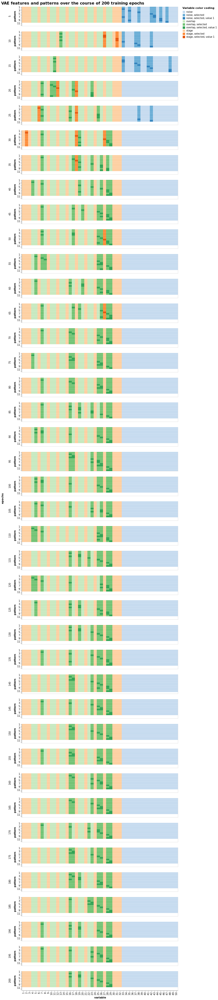

In [6]:
plot = plotdf |> 
            @vlplot(title={text="VAE features and patterns over the course of $(nepochs) training epochs", 
                            anchor="start", fontSize=16},
                    mark=:rect,
                    width=650,
                    height=80,
                    encoding={row="epochs:o",
                                x={field="x", typ="ordinal", sort="null", title = "variable"},
                                y={field="patternno", typ="ordinal", title="pattern"},
                                color={field="legend", typ="ordinal", 
                                        scale={range=["#c6dbef", "#6baed6", "#3182bd",
                                                        "#c7e9c0", "#74c476", "#31a354",
                                                        "#fdd0a2", "#fd8d3c","#e6550d"]},
                                        legend={typ="symbol", title="Variable color coding"}
                                        }
                                }
                    )

For the Figure in the paper, we only displayed the training state after certain epochs. We can now easily obtain the original plot by filtering our dataframe and plotting the smaller dataframe as before. 

Fontconfig warning: "/etc/fonts/fonts.conf", line 86: unknown element "blank"
Fontconfig warning: "/etc/fonts/fonts.conf", line 86: unknown element "blank"


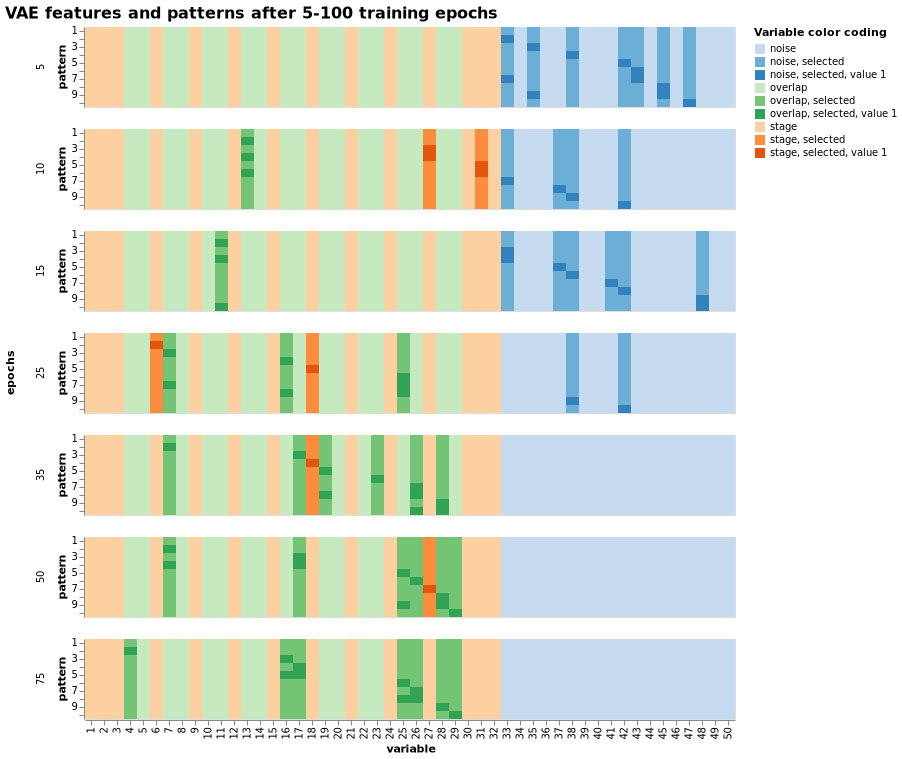

In [7]:
smallerdf = filter(row -> row.epochs ∈ [5, 10, 15, 25, 35, 50, 75], plotdf)
smallerplot = smallerdf |> 
                    @vlplot(title={text="VAE features and patterns after 5-100 training epochs", 
                                    anchor="start", fontSize=16},
                            mark=:rect, 
                            width=650, 
                            height=80, 
                            encoding={
                                row="epochs:o",
                                x={field="x", typ="ordinal", sort="null", title = "variable"},
                                y={field="patternno", typ="ordinal", title="pattern"},
                                color={field="legend", typ="ordinal", 
                                        scale={range=["#c6dbef", "#6baed6", "#3182bd",
                                                        "#c7e9c0", "#74c476", "#31a354",
                                                        "#fdd0a2", "#fd8d3c","#e6550d"]},
                                        legend={typ="symbol", title="Variable color coding"}
                                        }
                                }
                            )

### Spatial representation of patterns from the Deep Boltzmann Machine

Now, we visualize the training process with respect to the latent representation of frequent patterns learned by a DBM model. 

#### Generating artificial data
For this task, we increase the number `p` of variables to 200 and the number `n` of artificial observations to 5000 while we employ the same stair-like structure as before, i.e. simulating expression of 32 genes discrimating `stageno` cell stages and `p` - 32 = 168 noise genes. 

In [8]:
# simulate new data with more observations and genes while maintaining the same stair-like structure as before 
n=5000
p=200
stageno = 10
stagep = Int(50/stageno)
stagen = Int(n/stageno)
stageoverlap = 2
blockprob = 0.6
noiseprob = 0.1

Random.seed!(11);
x = 1.0*(rand(n,p) .> (1-noiseprob))

addstages!(x,stageno,stagen=stagen,stagep=stagep,overlap=stageoverlap,blockprob=blockprob);

#### Training the DBM

On our new dataset `x`, we now train a DBM for 2, 20, 50, 100 and 200 epochs and obtain `n`\*10 samples of both hidden and top-level visible nodes, similar to sampling values of the hidden z's and their corresponding decoded values in the VAE as we did before. 

For DBM training, we employ the package `BoltzmannMachines`. 
With the function `getlayers`, we define the architecture of our DBM model by defining two layers, their corresponding numbers of hidden nodes `nhidden` defined by `h1factor` and `h2no`, the numbers of epochs `epochs` the layers are pretrained and the corresponding learningrates `learningrates`. 
The actual training and sampling is carried out with the function `fitandsampledbm`. It allows to specify the numbers of epochs for pretraining each layer and for training the overall DBM model as well as the number of samples as a factor of `n` and outputs samples for both hidden and visible nodes obtained by Gibbs sampling. 
The samples for each number of training epochs are collected in `epochparticles`.

In [9]:
# package for DBM training
Pkg.add(Pkg.PackageSpec(;name="BoltzmannMachines", version="1.2.0"))
using BoltzmannMachines

# functions for DBM training
function getlayers(x;h1factor=1,h2no=2,epochs=20,h1learningrate=0.005)
    [
     BoltzmannMachines.TrainLayer(learningrates=[0.0008*ones(Int(ceil(epochs/2))); 0.0001*ones(Int(floor(epochs/2)))], 
                                    epochs = epochs,
                                    nhidden = Int(size(x,2)/h1factor));
     BoltzmannMachines.TrainLayer(learningrates=fill(h1learningrate,epochs), 
                                    epochs = epochs,
                                    nhidden=h2no)
    ]
end

function fitandsampledbm(x; preepochs=100, epochs=20, samplefactor=10)
    trainlayers = getlayers(x,h2no=2,epochs=preepochs,h1learningrate=0.005)
    dbm = stackrbms(x;predbm=true,trainlayers=trainlayers);
    traindbm!(dbm,x;epochs=epochs,learningrate=0.003);
    particles = BoltzmannMachines.initparticles(dbm,size(x,1)*samplefactor)
    BoltzmannMachines.gibbssample!(particles,dbm,50)
    particles
end

# train and sample DBM model for several numbers of epochs
epochparticles = map(Int[2,20,50,100,200]) do epoch
    Random.seed!(10+42)
    fitandsampledbm(x,preepochs=epoch,epochs=epoch,samplefactor=10);
    end;

 Resolving package versions...
  Updating `~/.julia/environments/v1.0/Project.toml`
 [no changes]
  Updating `~/.julia/environments/v1.0/Manifest.toml`
 [no changes]


#### Log-linear modelling

For each of the five states in the training process, we now extract a feature set of size `nsetvars` by log-linear modeling as before and form their union. Subsequently, we infer the `npatterns` most frequent patterns exhibited by the common feature set in each of the training states and combine the five resulting sets of patterns:

In [10]:
nsetvars = 4
npatterns = 10

epochsets = map(parts -> PatternsByLogLin.bestset(nsetvars, parts[1],parts[3], verbose=false),epochparticles)
jointset = sort(union(epochsets...))
epochpatterns = map(parts -> toppatterns(parts[1],jointset,patternno=npatterns),epochparticles)
jointpatterns = union(epochpatterns...)

13-element Array{Array{Float64,1},1}:
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
 [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
 [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
 [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
 [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
 [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0]
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0]
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0]
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0]
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]
 [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

#### Two-dimensional pattern representation
Now, for each state we obtain a a two-dimensional representation of the common patterns by applying multidimensional scaling to the dissimilarity matrix of the patterns. Pattern dissimilarity is quantified by the Jensen-Shannon-divergence of the corresponding distributions over hidden feature values. 

We create a dataframe `df` from the multidimensional scaling coordinates in `epochcoords` comprising the following columns:
* the `x`-column contains the multidimensional scaling x-coordinates from all epochs
* the `y`-column contains the corresponding y-coordinates from all epochs
* the `epoch`-column contains the number of epochs, i.e., the training state corresponding to the pattern coordinates
* the `labval` -column contains the pattern corresponding to the x and y coordinates represented as pattern of dashes and bars, where a dash indicate a value 0 for the corresponding variable in the pattern and a bar indicates a 1


-- Function `patterncoords` currently returns a deprecation warning from
the function which performs the multidimensional
scaling, but we currently stick with the old function call since it is
in accordance with the documentation at
https://multivariatestatsjl.readthedocs.io/en/stable/cmds.html. --

In [11]:
# get multidimensional scaling coordinates of pattern dissimilarity matrix
epochcoords = map(parts -> PatternsByLogLin.patterncoords(parts[1],parts[3],jointset,jointpatterns),epochparticles)

# create dataframe
xcoord = cat(map(coord -> coord[2][1,:],epochcoords)...,dims=1)
ycoord = cat(map(coord -> coord[2][2,:],epochcoords)...,dims=1)
labval = map(pattern -> string(map(val -> val == 0.0 ? "." : "|",pattern)...),jointpatterns)
epochs = [2, 20, 50, 100, 200]

df = DataFrame(x=xcoord,y=ycoord,
               epoch=repeat(string.(epochs),inner=length(jointpatterns)),
               labels=repeat(labval,length(epochcoords)),
               size=repeat([0.05],length(xcoord)))

┌ Warning: `classical_mds(D::AbstractMatrix, p::Int)` is deprecated, use `transform(fit(MDS, D, maxoutdim=p, distances=true))` instead.
│   caller = patterncoords(::Array{Float64,2}, ::Array{Float64,2}, ::Array{Int64,1}, ::Array{Array{Float64,1},1}) at patterncoords.jl:27
└ @ PatternsByLogLin /home/mo/.julia/packages/PatternsByLogLin/MhdUx/src/patterncoords.jl:27


,x,y,epoch,labels,size
,Float64,Float64,String,String,Float64
1,-0.0087078,0.00348685,2,............,0.05
2,0.0577396,0.00391586,2,.|..........,0.05
3,0.0228539,0.00494016,2,..|.........,0.05
4,-0.00698031,-0.00714419,2,...|........,0.05
5,-0.0152875,0.00294595,2,....|.......,0.05
6,0.0218164,-0.0245177,2,.....|......,0.05
7,-0.00810268,-0.025751,2,......|.....,0.05
8,-0.0122981,0.0246084,2,........|...,0.05
9,-0.00889349,0.0177176,2,.........|..,0.05


#### Plotting the results

We create a plot for each state in the training process, i.e., for each number of epochs the DBM was trained before we extracted the set of variables most strongly driven by the latent states and their most frequent patterns. 
Each object in a plot corresponds to a pattern represented as in the `labval`-column of our dataframe, i.e., dashes indicate a 0 and vertical bars a 1 observed in the pattern.

Fontconfig warning: "/etc/fonts/fonts.conf", line 86: unknown element "blank"
Fontconfig warning: "/etc/fonts/fonts.conf", line 86: unknown element "blank"


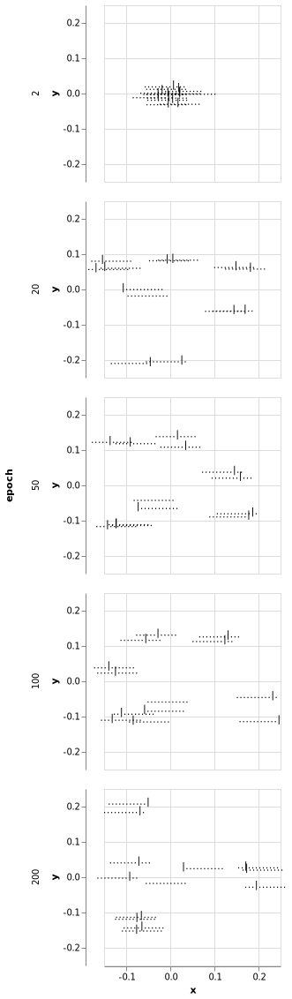

In [12]:
patternplot = df |> 
    @vlplot(:text,x=:x,y=:y,text=:labels,row={field="epoch", sort=["2","20","50","100","200"]},fontSize=:size)

## Comparing DBM and VAE pattern representations

In this section, we compare the representations learned from a DBM and a VAE on our artificial dataset. Having identified a set of variables particularly driven by the hidden states, we infer a dissimilarity matrix of their most frequent patterns to obtain an easily interpretable low-dimensional spatial representation as described above and compare the representation of the two generative models on a common feature set.

#### Generating artificial data
We employ the smaller dataset of 1000 artificial observations and 50 modelled genes from the first section:

In [13]:
# create artificial dataset
n=1000
p=50
stageno = 10
stagep = Int(p/stageno)
stagen = Int(n/stageno)
stageoverlap = 2 
blockprob = 0.6
noiseprob = 0.1

Random.seed!(22);
x = 1.0*(rand(n,p) .> (1-noiseprob))

addstages!(x,stageno,stagen=stagen,stagep=stagep,overlap=stageoverlap,blockprob=blockprob);

#### Training the models

We now train each model for the same number of epochs specified by `nepochs`, using the same model architectures, packages and functions as before, and draw `n`\*50 samples of both latent and visible/decoded values for each model:

In [14]:
nepochs = 100

# define VAE model as before
Dz, Dh = 5, p 
Random.seed!(13);
# encoder
A, latentμ, latentlogσ = Dense(p, Dh, tanh), Dense(Dh, Dz), Dense(Dh, Dz)
g(X) = (h = A(X); (latentμ(h), latentlogσ(h)))
# latent space of z's
latentz(μ, logσ) = μ + exp.(logσ) * randn()
# decoder
f = Chain(Dense(Dz, Dh, tanh), Dense(Dh, p, σ))
# loss
kl_q_p(μ, logσ) = 0.5 * sum(exp.(2 .* logσ) + μ.^2 .- 1 .- (2 .* logσ))
logp_x_z(x, z) = sum(logpdf.(Bernoulli.(f(z)), x))
L(X) = ((emp_μ, emp_logσ) = g(X); (logp_x_z(X, latentz.(emp_μ, emp_logσ)) - kl_q_p(emp_μ, emp_logσ)))
loss(X) = -L(X) + 0.01 * sum(x->sum(x.^2), Flux.params(f))

# train the VAE
ps = Flux.params(A, latentμ, latentlogσ, f)
opt = ADAM(0.0001)
data = [x[i,:]' for i in Iterators.partition(1:n,1)]
for epoch = 1:nepochs
    Flux.train!(loss, ps, zip(data), opt)
end

# sample from the trained model
vaegen = fill(0.0,n*50,p); 
vaehidden_orig = fill(0.0,n*50,Dz);
for i = 1:n*50
    curzs = latentz.(zeros(Dz), zeros(Dz));
    vaehidden_orig[i,:] = curzs; # original values from latent space (real valued)
    vaegen[i,:] = Int.(rand.(Bernoulli.(f(curzs)))).data; # decoded
end
vaehidden = 1.0.*(vaehidden_orig .>= 0); # dichotomize real valued zs
vaesamples = [vaegen, vaehidden];

In [15]:
# train dbm model as before
Random.seed!(13);
particles = fitandsampledbm(x,preepochs=nepochs, epochs=nepochs, samplefactor=50);

#### Log-linear modelling
We apply log-linear modelling to extract a set of variables strongly driven by the hidden units for each of the generative models of size `nsetvars` as before. We then form the union of the two sets, determine the set of most frequent patterns of size `npatterns` exhibited by the common variables in each model and combine all of the pattern sets.

In [16]:
nsetvars = 7
npatterns = 8

# log-linear modelling to extract feature set
vaevarset = sort(PatternsByLogLin.bestset(nsetvars,vaesamples[1],vaesamples[2],verbose=false))
dbmvarset = sort(PatternsByLogLin.bestset(nsetvars, particles[1],particles[3], verbose=false))
# form union  
crossset = sort(union(vaevarset, dbmvarset))

# get top frequent patterns
dbmpatterns = toppatterns(particles[1],crossset,patternno=npatterns)
vaepatterns = toppatterns(vaesamples[1],crossset,patternno=npatterns)
crosspatterns = union(dbmpatterns,vaepatterns)

9-element Array{Array{Float64,1},1}:
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
 [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
 [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
 [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
 [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0]
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0]
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]

#### Two-dimensional pattern representation
As before, we infer the dissimilarity of these common patterns based on their corresponding distribution over latent feature values separately for the DBM and VAE and apply multidimensional scaling to obtain two-dimensional representations. We create a dataframe like the one in the previous section of the following structure:
* the `x`-column contains the multidimensional scaling x-coordinates from all patterns and both models
* the `y`-column contains the corresponding y-coordinates from all patterns and both models
* the `approach`-column contains the information whether the coordinates belong to the VAE or the DBM model
* the `labels` -column contains the pattern corresponding to the x and y coordinates represented as pattern of dashes and bars as before, where a dash indicates a value 0 for the corresponding variable in the pattern and a bar indicates a 1

In [17]:
# get dissimilarity matrices and corresponding multidimensional scaling coordinates 
vaedistmat, vaemdscoord = PatternsByLogLin.patterncoords(vaesamples[1],vaesamples[2],crossset,crosspatterns)
dbmdistmat, dbmmdscoord = PatternsByLogLin.patterncoords(particles[1],particles[3],crossset,crosspatterns)

# create dataframe
crosscoords = cat(vaemdscoord,dbmmdscoord,dims=2)
labval = map(pattern -> string(map(val -> val == 0.0 ? "." : "|",pattern)...),crosspatterns)
df = DataFrame(x=crosscoords[1,:],y=crosscoords[2,:],
               approach=repeat(["VAE","DBM"],inner=length(crosspatterns)),
               labels=repeat(labval,2),
               size=repeat([1],size(crosscoords,2)))

,x,y,approach,labels,size
,Float64,Float64,String,String,Int64
1,0.0116049,-0.00790173,VAE,...........,1
2,0.127319,0.0867033,VAE,|..........,1
3,0.12312,0.1294,VAE,..|........,1
4,0.0998708,-0.127343,VAE,...|.......,1
5,0.0562006,-0.141093,VAE,....|......,1
6,-0.0994912,0.00633068,VAE,........|..,1
7,-0.118858,0.0242973,VAE,.........|.,1
8,-0.114133,0.00626376,VAE,..........|,1
9,-0.0856332,0.023343,VAE,.......|...,1


#### Plotting the results
Finally, we plot our dataframe with `VegaLite`. 

Fontconfig warning: "/etc/fonts/fonts.conf", line 86: unknown element "blank"
Fontconfig warning: "/etc/fonts/fonts.conf", line 86: unknown element "blank"


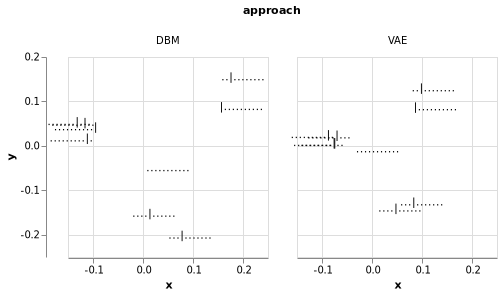

In [18]:
patternplot = df |> @vlplot(:text,x=:x,y=:y,text=:labels,column=:approach,fontSize=:size)